In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Dropout, BatchNormalization
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from PIL import Image
from skimage import transform
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
import itertools
import cv2

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

In [2]:
train_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/train/'
valid_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/val/'
test_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/test/'

In [3]:
photo_size=299

In [4]:
def prepare_dataset(data_dir):
    datagen = ImageDataGenerator(
        rescale= 1./255,
        rotation_range=40,
        width_shift_range=.2,
        height_shift_range=.2,
        shear_range=.1,
        zoom_range=.2,
        horizontal_flip=True,
        fill_mode='nearest',
    )
    generator = datagen.flow_from_directory(
        data_dir,
        shuffle=True,
        color_mode = "rgb",
        target_size=(photo_size,photo_size),
        class_mode='binary',
        batch_size=128,
        classes=['NORMAL','PNEUMONIA']
    )
    return generator

In [5]:
train_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/train/')
validation_generator = prepare_dataset('../input/chest-xray-pneumonia/chest_xray/val/')
test_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/test/')

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


In [6]:
validation_generator.class_indices

{'NORMAL': 0, 'PNEUMONIA': 1}

In [7]:
def show_few_images(number_of_examples=6, models=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(test_folders)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(test_folders)):
        
        image_ids = os.listdir(os.path.join(test_folders,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            path = os.path.join(test_folders,folder,image_ids[j])
            
            display = plt.imread(path)
            plt.axis('off')
            figure1.tight_layout()
            ax1[axs].imshow(display)
            title = 'True: '+folder

            if(models):
                for model in models:
                    if (model==DeepPneuNet):
                        img = cv2.resize(cv2.imread(path),(299,299))
                        img_normalized = img/255
                        image_DeepPneuNet_prediction = DeepPneuNet.predict(np.array([img_normalized])).argmax()
                        if (image_DeepPneuNet_prediction==1):
                            title = title+"\nDeepPneuNet Prediction: PNEUMONIA"
                        else:
                            title = title+"\nDeepPneuNet Prediction: NORMAL"
            ax1[axs].set_title(title)
            axs=axs+1

/tmp/ipykernel_22/2928570857.py:15: UserWarning: The figure layout has changed to tight
  figure1.tight_layout()


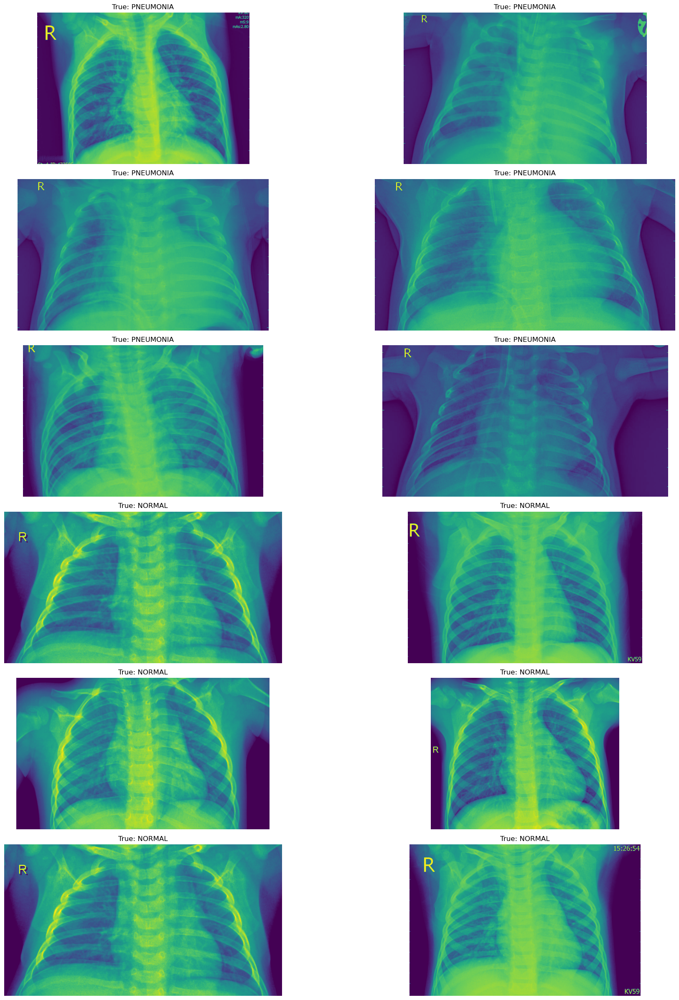

In [8]:
show_few_images()

In [9]:
epochs = 150

In [10]:
DeepPneuNet = Sequential([
    Conv2D(16, (1, 1), activation='relu', input_shape=(299, 299, 3)),
    Conv2D(16, (1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Conv2D(32, (1, 1), activation='relu'),
    Conv2D(32, (1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Conv2D(64, (1, 1), activation='relu'),
    Conv2D(64, (1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Conv2D(128, (1, 1), activation='relu'),
    Conv2D(128, (1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Conv2D(256, (1, 1), activation='relu'),
    Conv2D(256, (1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Conv2D(512, (1, 1), activation='relu'),
    Conv2D(512, (1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.2),
    Dense(512, activation='relu'),
    Dropout(0.2),
    Dense(2, activation='sigmoid')
])

DeepPneuNet.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 299, 299, 16)      64        
                                                                 
 conv2d_1 (Conv2D)           (None, 299, 299, 16)      272       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 149, 149, 16)     0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 149, 149, 16)     64        
 ormalization)                                                   
                                                                 
 conv2d_2 (Conv2D)           (None, 149, 149, 32)      544       
                                                                 
 conv2d_3 (Conv2D)           (None, 149, 149, 32)      1

In [11]:
DeepPneuNet.compile(loss = 'sparse_categorical_crossentropy', optimizer= RMSprop(learning_rate=0.001), metrics=['accuracy'])

history_DeepPneuNet = DeepPneuNet.fit(
    train_generator,
    epochs = epochs,
    validation_data = validation_generator
    )
DeepPneuNet.save("DeepPneuNet_RMSprop_150.h5")

Epoch 1/150
41/41 [==============================] - 207s 5s/step - loss: 0.8313 - accuracy: 0.8397 - val_loss: 2.0701 - val_accuracy: 0.5000
Epoch 2/150
41/41 [==============================] - 156s 4s/step - loss: 0.2864 - accuracy: 0.8848 - val_loss: 2.5945 - val_accuracy: 0.5000
Epoch 3/150
41/41 [==============================] - 156s 4s/step - loss: 0.2616 - accuracy: 0.8946 - val_loss: 6.3312 - val_accuracy: 0.5000
Epoch 4/150
41/41 [==============================] - 157s 4s/step - loss: 0.2450 - accuracy: 0.8992 - val_loss: 7.4730 - val_accuracy: 0.5000
Epoch 5/150
41/41 [==============================] - 156s 4s/step - loss: 0.2374 - accuracy: 0.9124 - val_loss: 8.3533 - val_accuracy: 0.5000
Epoch 6/150
41/41 [==============================] - 155s 4s/step - loss: 0.2114 - accuracy: 0.9105 - val_loss: 10.6134 - val_accuracy: 0.5000
Epoch 7/150
41/41 [==============================] - 154s 4s/step - loss: 0.2040 - accuracy: 0.9160 - val_loss: 13.4684 - val_accuracy: 0.5000
Epoc

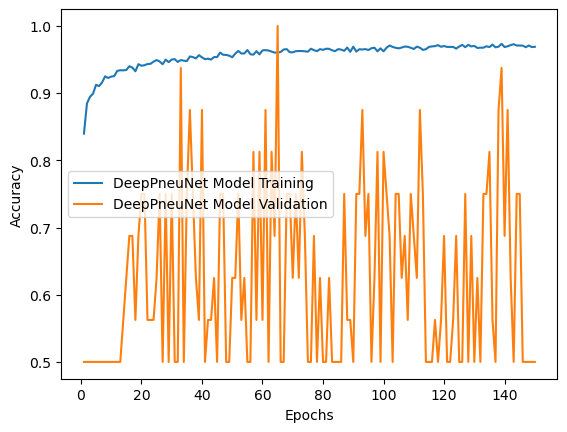

In [12]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot(x, history_DeepPneuNet.history['accuracy'], label = "DeepPneuNet Model Training", linestyle="-")
plt.plot(x, history_DeepPneuNet.history['val_accuracy'], label = "DeepPneuNet Model Validation", linestyle="-")
plt.legend()
plt.show()

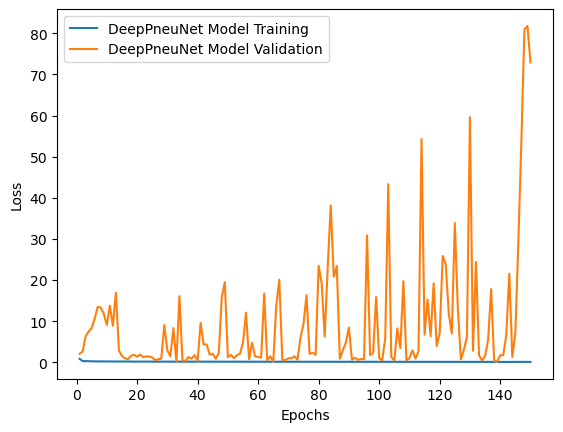

In [13]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(x, history_DeepPneuNet.history['loss'], label = "DeepPneuNet Model Training", linestyle="-")
plt.plot(x, history_DeepPneuNet.history['val_loss'], label = "DeepPneuNet Model Validation", linestyle="-")
plt.legend()
plt.show()

In [14]:
true_value = []
pred_DeepPneuNet = []

for folder in os.listdir(test_folders):
    
    test_image_ids = os.listdir(os.path.join(test_folders,folder))
    
    for image_id in test_image_ids[:int(len(test_image_ids))]:
        
        path = os.path.join(test_folders,folder,image_id)
        
        true_value.append(test_generator.class_indices[folder])
        img = cv2.resize(cv2.imread(path),(299,299))
        img_normalized = img/255
        
        image_DeepPneuNet_prediction = DeepPneuNet.predict(np.array([img_normalized])).argmax()
        pred_DeepPneuNet.append(image_DeepPneuNet_prediction)
        
print(true_value)
print(pred_DeepPneuNet)

1/1 [==============================] - 0s 25ms/step
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [15]:
from sklearn.metrics import confusion_matrix
import itertools
def clf_report(true_value, model_pred):
    classes = test_generator.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)

    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass

    print(classification_report(true_value, model_pred, target_names = list(classes)))

Model Accuracy 0.625
              precision    recall  f1-score   support

      NORMAL       0.00      0.00      0.00       234
   PNEUMONIA       0.62      1.00      0.77       390

    accuracy                           0.62       624
   macro avg       0.31      0.50      0.38       624
weighted avg       0.39      0.62      0.48       624



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


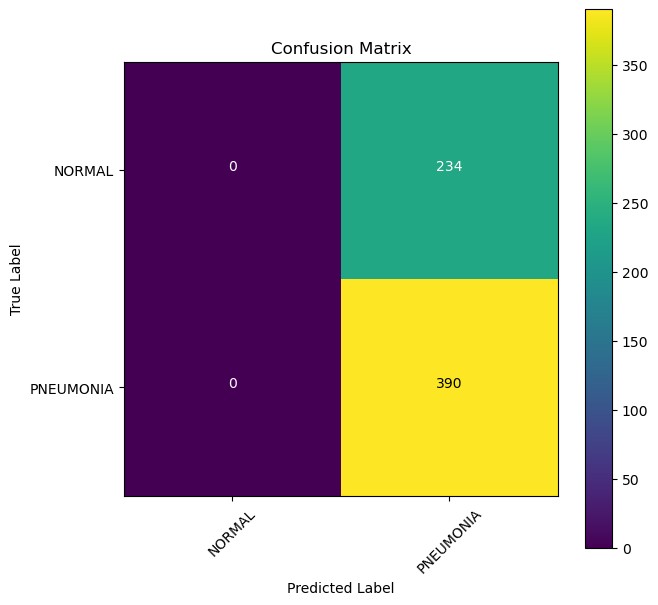

In [16]:
clf_report(true_value, pred_DeepPneuNet)

In [17]:
models = [DeepPneuNet]

1/1 [==============================] - 0s 25ms/step


/tmp/ipykernel_22/2928570857.py:15: UserWarning: The figure layout has changed to tight
  figure1.tight_layout()


1/1 [==============================] - 0s 28ms/step


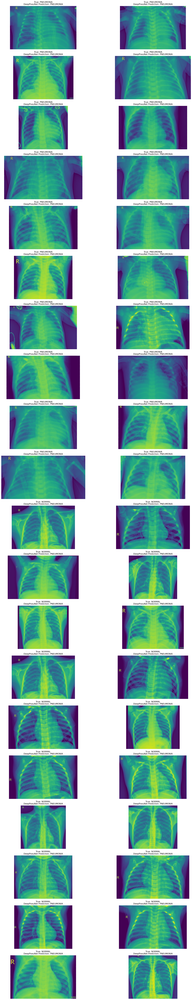

In [18]:
show_few_images(20, models)